In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import os
import json
import subprocess
from scipy.misc import imread
%matplotlib inline

from train import build_lstm_forward, build_overfeat_forward
from utils import googlenet_load, train_utils
from utils.annolist import AnnotationLib as al
from utils.stitch_wrapper import stitch_rects
from utils.train_utils import add_rectangles

In [32]:
hypes_file = './hypes/reinspect.json'
iteration = 190000
with open(hypes_file, 'r') as f:
    H = json.load(f)
true_idl = './data/brainwash/brainwash_val.idl'
pred_idl = './output/%d_val_%s.idl' % (iteration, os.path.basename(hypes_file).replace('.json', ''))
true_annos = al.parse(true_idl)

In [33]:
from utils.rect import Rect
from utils.stitch_wrapper import stitch_rects
import cv2

def add_rectangles(orig_image, confidences, boxes, arch, use_stitching=False, rnn_len=1, min_conf=0.5):
    image = np.copy(orig_image[0])
    num_cells = arch["grid_height"] * arch["grid_width"]
    boxes_r = np.reshape(boxes, (-1,
                                 arch["grid_height"],
                                 arch["grid_width"],
                                 rnn_len,
                                 4))
    confidences_r = np.reshape(confidences, (-1,
                                             arch["grid_height"],
                                             arch["grid_width"],
                                             rnn_len,
                                             2))
    cell_pix_size = 32
    all_rects = [[[] for _ in range(arch["grid_width"])] for _ in range(arch["grid_height"])]
    for n in range(0, 5):
        for y in range(arch["grid_height"]):
            for x in range(arch["grid_width"]):
                bbox = boxes_r[0, y, x, n, :]
                conf = confidences_r[0, y, x, n, 1]
                abs_cx = int(bbox[0]) + cell_pix_size/2 + cell_pix_size * x
                abs_cy = int(bbox[1]) + cell_pix_size/2 + cell_pix_size * y
                w = bbox[2]
                h = bbox[3]
                all_rects[y][x].append(Rect(abs_cx,abs_cy,w,h,conf))

    if use_stitching:
        acc_rects = stitch_rects(all_rects)
    else:
        acc_rects = [r for row in all_rects for cell in row for r in cell if r.confidence > 0.1]


    for rect in acc_rects:
        if rect.confidence > min_conf:
            cv2.rectangle(image,
                (rect.cx-int(rect.width/2), rect.cy-int(rect.height/2)),
                (rect.cx+int(rect.width/2), rect.cy+int(rect.height/2)),
                (0,255,0),
                2)

    rects = []
    for rect in acc_rects:
        r = al.AnnoRect()
        r.x1 = rect.cx - rect.width/2.
        r.x2 = rect.cx + rect.width/2.
        r.y1 = rect.cy - rect.height/2.
        r.y2 = rect.cy + rect.height/2.
        r.score = rect.true_confidence
        rects.append(r)

    return image, rects

0
100
200
300
400


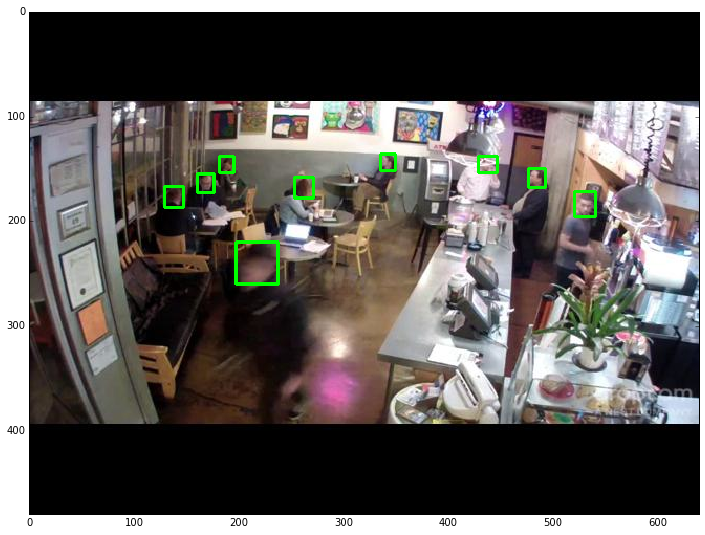

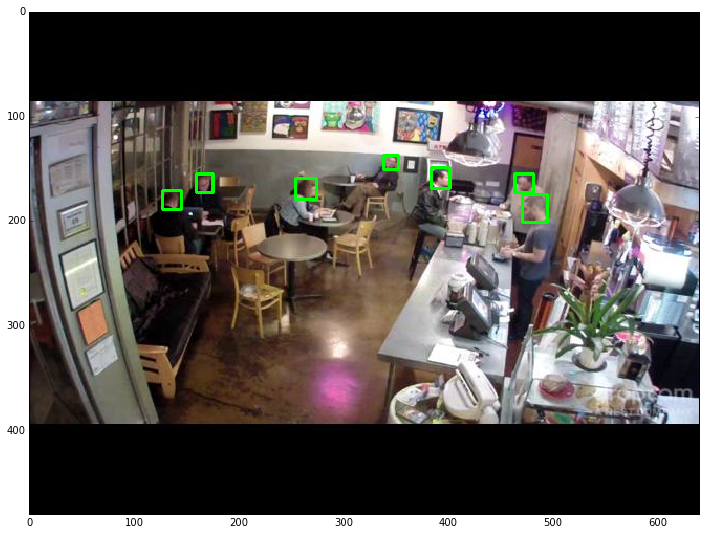

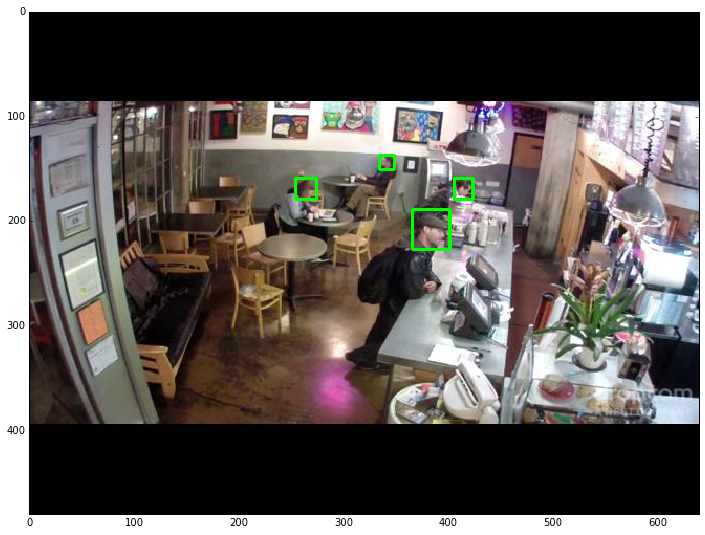

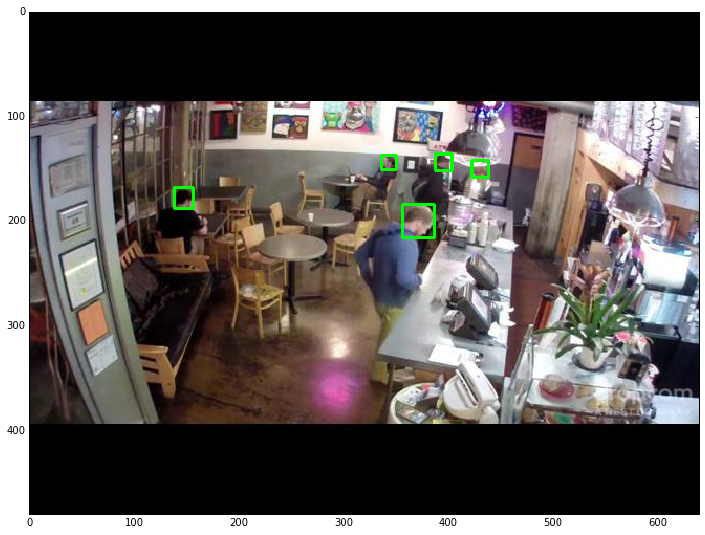

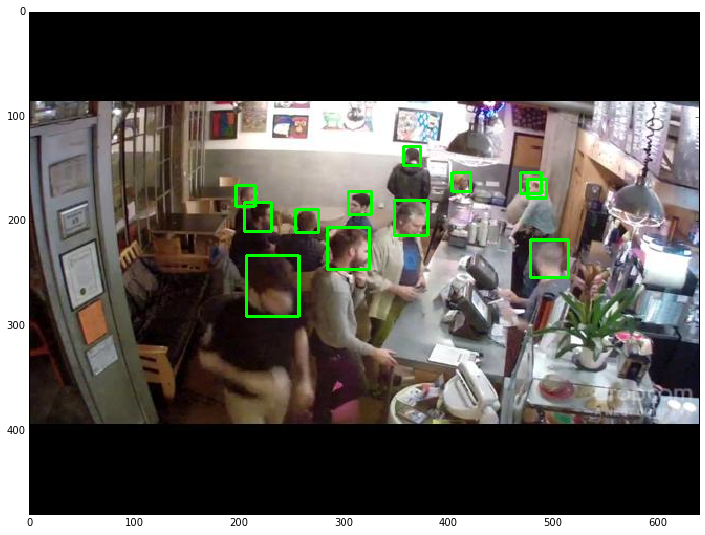

...

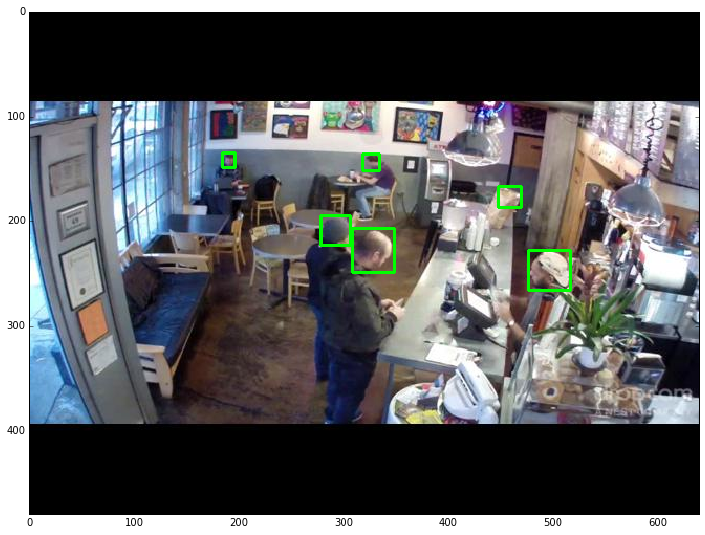

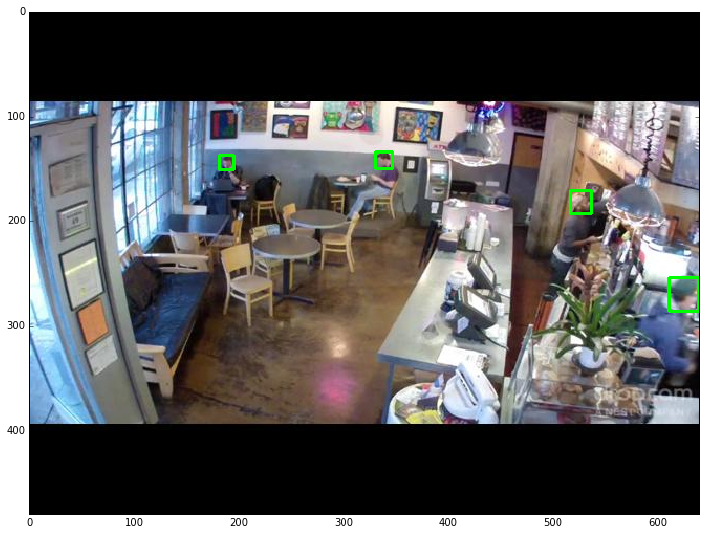

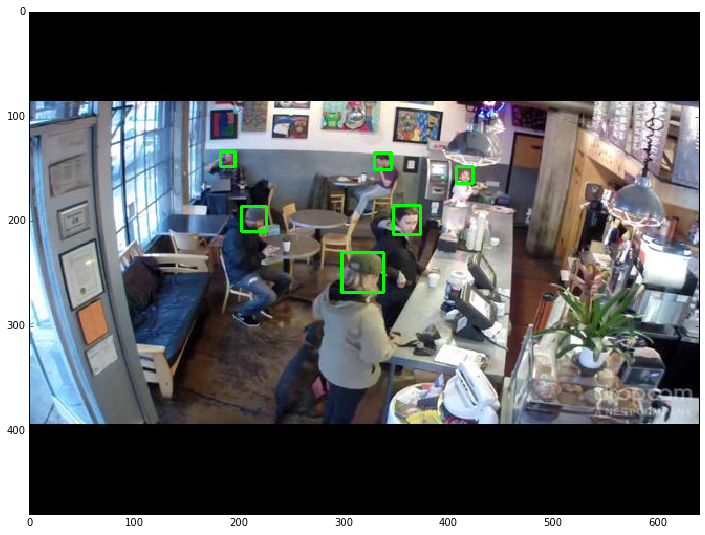

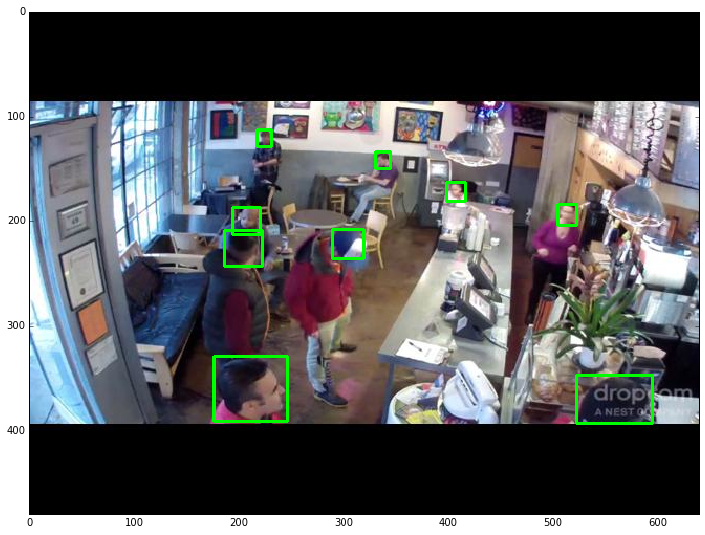

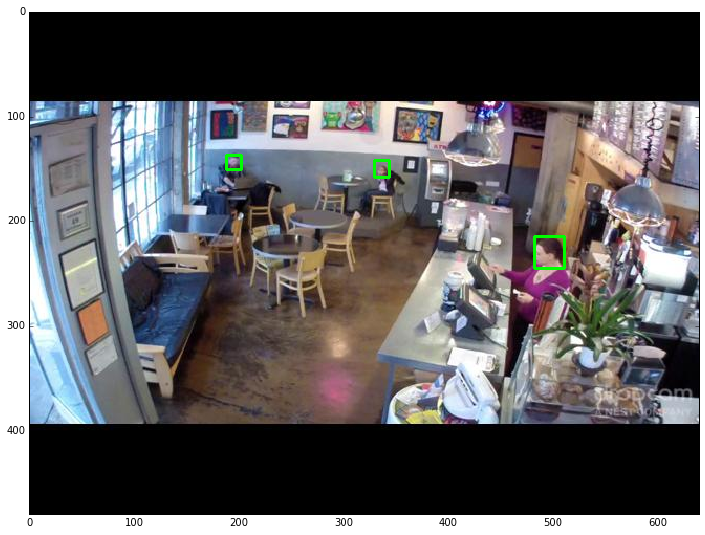

In [34]:
tf.reset_default_graph()
googlenet = googlenet_load.init(H)
x_in = tf.placeholder(tf.float32, name='x_in')
if H['arch']['use_lstm']:
    if H['arch']['use_reinspect']:
        pred_boxes, pred_logits, pred_confidences, pred_boxes_deltas = build_lstm_forward(H, tf.expand_dims(x_in, 0), googlenet, 'test', reuse=None)
        pred_confidences = tf.reshape(tf.nn.softmax(tf.reshape(pred_boxes_deltas, [1500, 2])), [300, 5, 2])
#         pred_boxes = pred_boxes + pred_boxes_deltas
    else:
        pred_boxes, pred_logits, pred_confidences = build_lstm_forward(H, tf.expand_dims(x_in, 0), googlenet, 'test', reuse=None)
else:
    pred_boxes, pred_logits, pred_confidences = build_overfeat_forward(H, tf.expand_dims(x_in, 0), googlenet, 'test')
saver = tf.train.Saver()
with tf.Session() as sess:
    sess.run(tf.initialize_all_variables())
    if H['arch']['use_lstm']:
        if H['arch']['use_reinspect']:
#             saver.restore(sess, 'output/reinspect_2016_02_27_17.35/save.ckpt-%d' % iteration)
            saver.restore(sess, 'output/reinspect_2016_03_01_23.46/save.ckpt-%d' % iteration)
        else:
            saver.restore(sess, 'output/lstm_2016_02_28_15.16/save.ckpt-%d' % iteration)
    else:
        saver.restore(sess, 'output/lstm_2016_02_27_16.42/save.ckpt-%d' % iteration)
        

    annolist = al.AnnoList()
    for i in range(0, 500, 1):
#     for i in range(0, 200, 10):
        true_anno = true_annos[i]
        img = imread('./data/brainwash/%s' % true_anno.imageName)
        feed = {x_in: img}
        (np_pred_boxes, np_pred_confidences) = sess.run([pred_boxes, pred_confidences], feed_dict=feed)
        pred_anno = al.Annotation()
        pred_anno.imageName = true_anno.imageName
        new_img, rects = add_rectangles([img], np_pred_confidences, np_pred_boxes,
                                        H["arch"], use_stitching=True, rnn_len=H['arch']['rnn_len'], min_conf=0.3)
    
        pred_anno.rects = rects
        annolist.append(pred_anno)

#         fig = plt.figure(figsize=(12, 12))
#         plt.imshow(new_img)
#         continue
        
        if i % 10 == 0 and i < 200:
            fig = plt.figure(figsize=(12, 12))
            plt.imshow(new_img)
        if i % 100 == 0:
            print(i)


saving:  ./output/190000_val_reinspect.idl
$ ./utils/annolist/doRPC.py --minOverlap 0.500000 ./data/brainwash/brainwash_val.idl ./output/190000_val_reinspect.idl
Minimum width: 0 height: 0
Asorting too large/ too small detections
minWidth: 0
minHeight: 0
maxWidth:  inf
maxHeight:  inf
#Annotations: 3318
Setting up graphs ...
missingFrames:  0
Number of detections on annotated frames:  3487
Sorting scores ...
Gradually decrease score ...
saving:
/hr1/h/box_reinspect/output/rpc-190000_val_reinspect_overlap0.5.txt

$ ./utils/annolist/plotSimple.py /hr1/h/box_reinspect/output/rpc-150000_val_reinspect_overlap0.5.txt /hr1/h/box_reinspect/output/rpc-190000_val_reinspect_overlap0.5.txt --output output/results.png


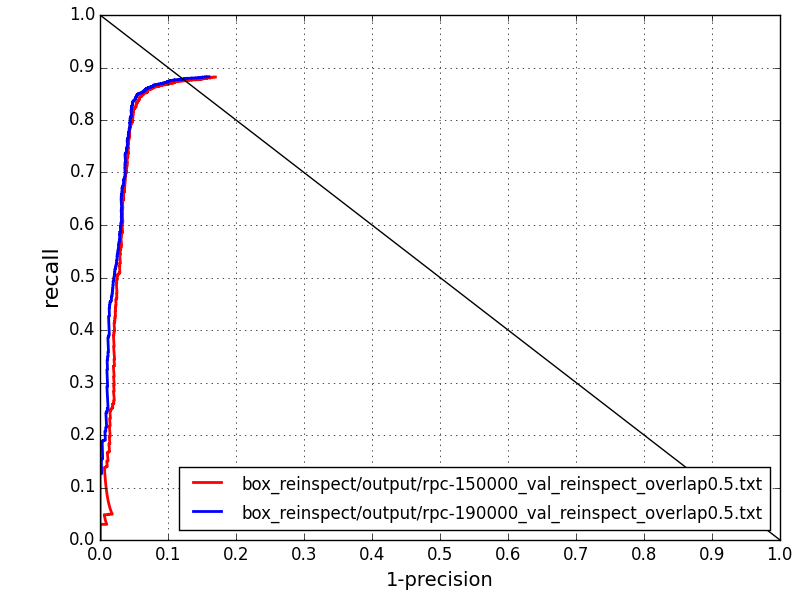

In [37]:
annolist.save(pred_idl)
iou_threshold = 0.5
rpc_cmd = './utils/annolist/doRPC.py --minOverlap %f %s %s' % (iou_threshold, true_idl, pred_idl)
print('$ %s' % rpc_cmd)
rpc_output = subprocess.check_output(rpc_cmd, shell=True)
print(rpc_output)
txt_file = [line for line in rpc_output.split('\n') if line.strip()][-1]
output_png = 'output/results.png'
# plot_cmd = './utils/annolist/plotSimple.py /hr1/h/box_reinspect/output/rpc-50000_val_lstm_overlap0.5.txt /hr1/h/box_reinspect/output/rpc-300000_val_lstm_overlap0.5.txt /hr1/h/box_reinspect/output/rpc-100000_val_lstm_overlap0.5.txt /hr1/h/box_reinspect/output/rpc-320000_val_lstm_overlap0.5.txt %s --output %s' % (txt_file, output_png)
plot_cmd = './utils/annolist/plotSimple.py /hr1/h/box_reinspect/output/rpc-150000_val_reinspect_overlap0.5.txt %s --output %s' % (txt_file, output_png)
print('$ %s' % plot_cmd)
plot_output = subprocess.check_output(plot_cmd, shell=True)
from IPython.display import Image
Image(filename=output_png) 

saving:  ./output/val_lstm.idl
$ ./utils/annolist/doRPC.py --minOverlap 0.500000 ./data/brainwash/brainwash_val.idl ./output/val_lstm.idl
Minimum width: 0 height: 0
Asorting too large/ too small detections
minWidth: 0
minHeight: 0
maxWidth:  inf
maxHeight:  inf
#Annotations: 3318
Setting up graphs ...
missingFrames:  0
Number of detections on annotated frames:  4121
Sorting scores ...
Gradually decrease score ...
saving:
/hr1/h/box/output/rpc-val_lstm_overlap0.5.txt

$ ./utils/annolist/plotSimple.py /hr1/h/box/output/rpc-val_lstm_overlap0.5.txt --output output/results.png


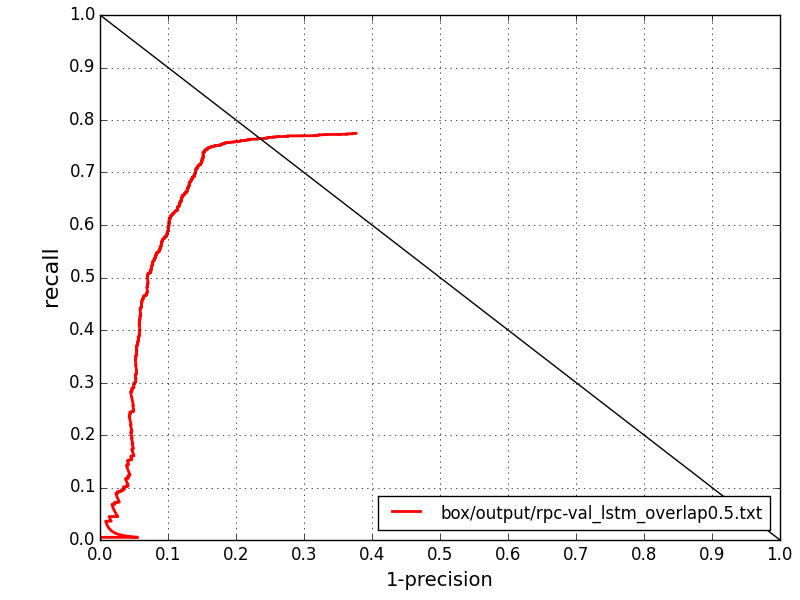

In [20]:
annolist.save(pred_idl)
iou_threshold = 0.5
rpc_cmd = './utils/annolist/doRPC.py --minOverlap %f %s %s' % (iou_threshold, true_idl, pred_idl)
print('$ %s' % rpc_cmd)
rpc_output = subprocess.check_output(rpc_cmd, shell=True)
print(rpc_output)
txt_file = [line for line in rpc_output.split('\n') if line.strip()][-1]
output_png = 'output/results.png'
plot_cmd = './utils/annolist/plotSimple.py %s --output %s' % (txt_file, output_png)
print('$ %s' % plot_cmd)
plot_output = subprocess.check_output(plot_cmd, shell=True)
from IPython.display import Image
Image(filename=output_png) 

saving:  ./output/val_reinspect.idl
$ ./utils/annolist/doRPC.py --minOverlap 0.500000 ./data/brainwash/brainwash_val.idl ./output/val_reinspect.idl
Minimum width: 0 height: 0
Asorting too large/ too small detections
minWidth: 0
minHeight: 0
maxWidth:  inf
maxHeight:  inf
#Annotations: 3318
Setting up graphs ...
missingFrames:  0
Number of detections on annotated frames:  5787
Sorting scores ...
Gradually decrease score ...
saving:
/hr1/h/box/output/rpc-val_reinspect_overlap0.5.txt

$ ./utils/annolist/plotSimple.py /hr1/h/box/output/rpc-val_reinspect_overlap0.5.txt --output output/results.png


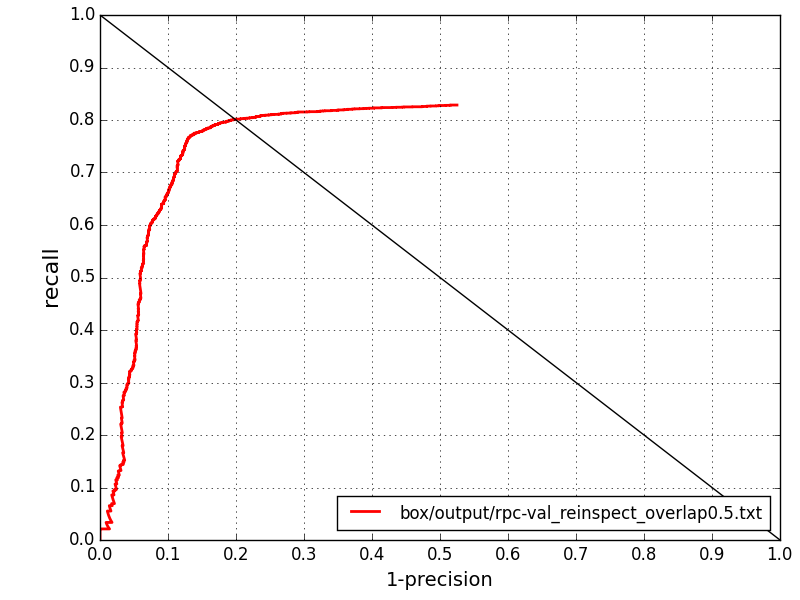

In [4]:
annolist.save(pred_idl)
iou_threshold = 0.5
rpc_cmd = './utils/annolist/doRPC.py --minOverlap %f %s %s' % (iou_threshold, true_idl, pred_idl)
print('$ %s' % rpc_cmd)
rpc_output = subprocess.check_output(rpc_cmd, shell=True)
print(rpc_output)
txt_file = [line for line in rpc_output.split('\n') if line.strip()][-1]
output_png = 'output/results.png'
plot_cmd = './utils/annolist/plotSimple.py %s --output %s' % (txt_file, output_png)
print('$ %s' % plot_cmd)
plot_output = subprocess.check_output(plot_cmd, shell=True)
from IPython.display import Image
Image(filename=output_png) 

saving:  ./output/val_lstm.idl
$ ./utils/annolist/doRPC.py --minOverlap 0.500000 ./data/brainwash/brainwash_val.idl ./output/val_lstm.idl
Minimum width: 0 height: 0
Asorting too large/ too small detections
minWidth: 0
minHeight: 0
maxWidth:  inf
maxHeight:  inf
#Annotations: 3318
Setting up graphs ...
missingFrames:  0
Number of detections on annotated frames:  3728
Sorting scores ...
Gradually decrease score ...
saving:
/hr1/h/box/output/rpc-val_lstm_overlap0.5.txt

$ ./utils/annolist/plotSimple.py /hr1/h/box/output/rpc-val_lstm_overlap0.5.txt --output output/results.png


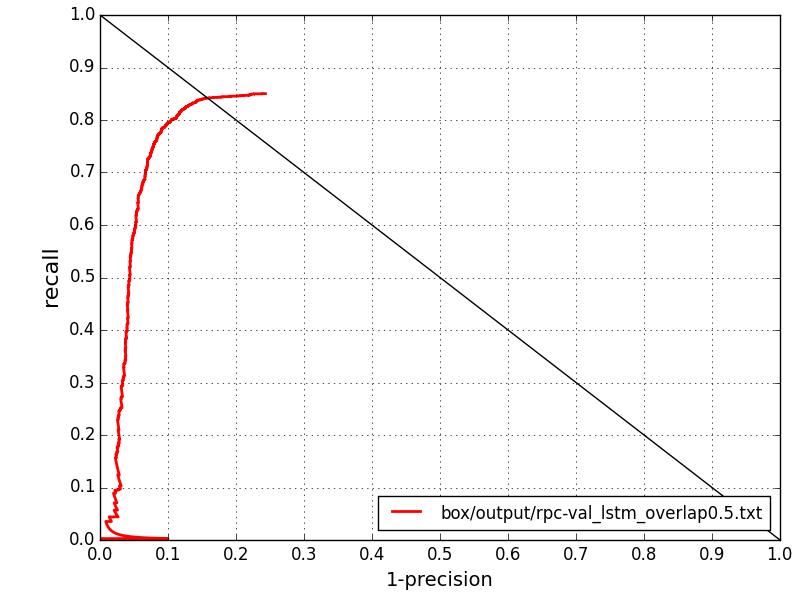

In [5]:
annolist.save(pred_idl)
iou_threshold = 0.5
rpc_cmd = './utils/annolist/doRPC.py --minOverlap %f %s %s' % (iou_threshold, true_idl, pred_idl)
print('$ %s' % rpc_cmd)
rpc_output = subprocess.check_output(rpc_cmd, shell=True)
print(rpc_output)
txt_file = [line for line in rpc_output.split('\n') if line.strip()][-1]
output_png = 'output/results.png'
plot_cmd = './utils/annolist/plotSimple.py %s --output %s' % (txt_file, output_png)
print('$ %s' % plot_cmd)
plot_output = subprocess.check_output(plot_cmd, shell=True)
from IPython.display import Image
Image(filename=output_png) 